<a href="https://colab.research.google.com/github/JulioLunaUNSA/VA_TAREAS/blob/main/Copia_de_ProcImagenes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt
import math

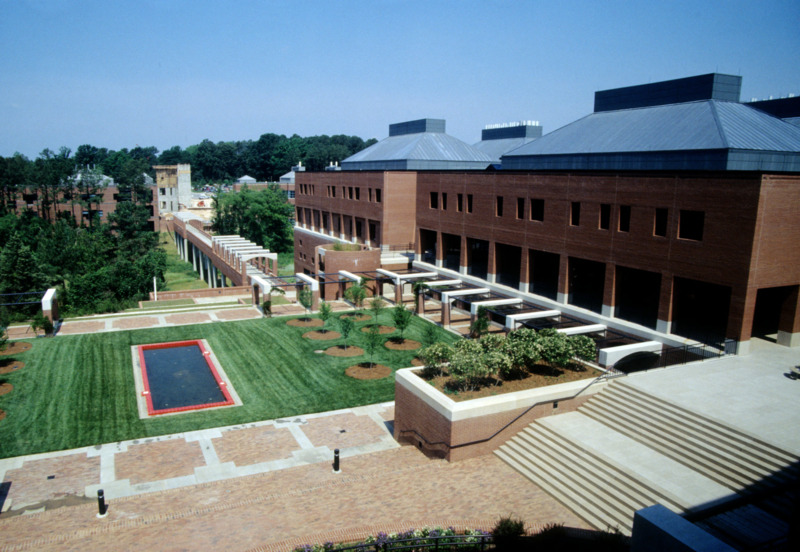

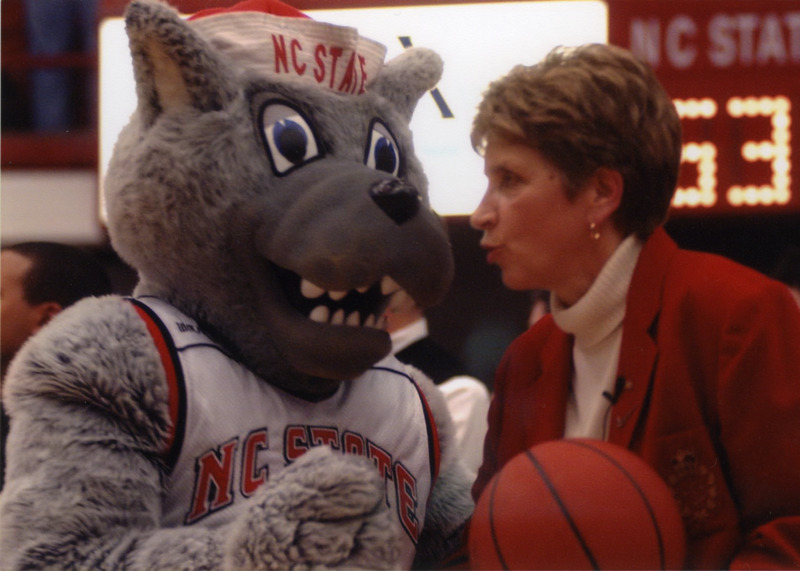

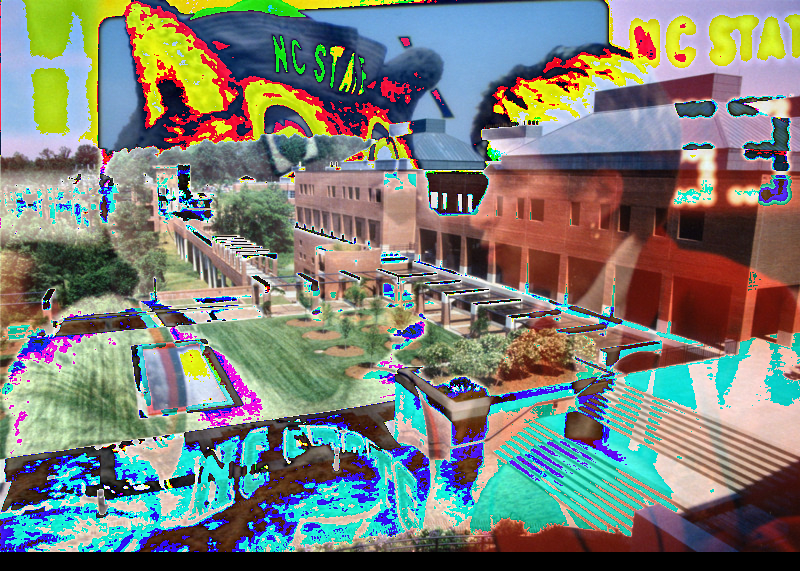

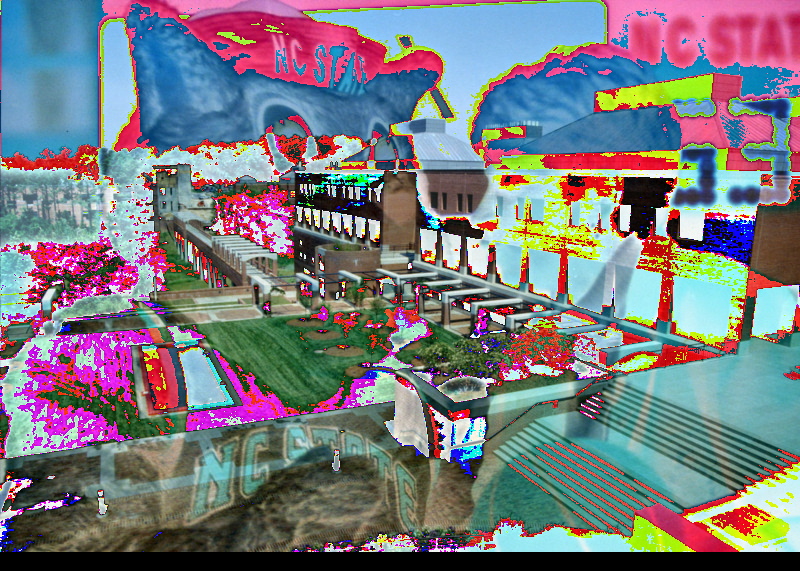

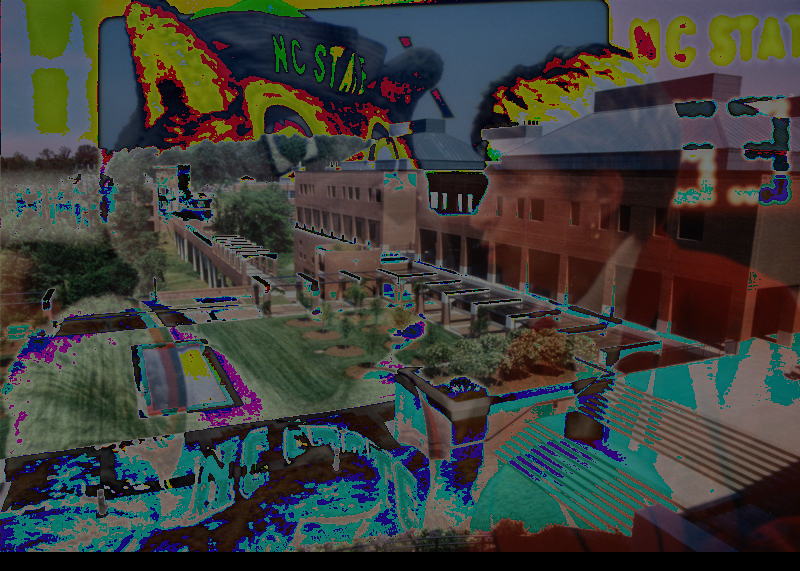

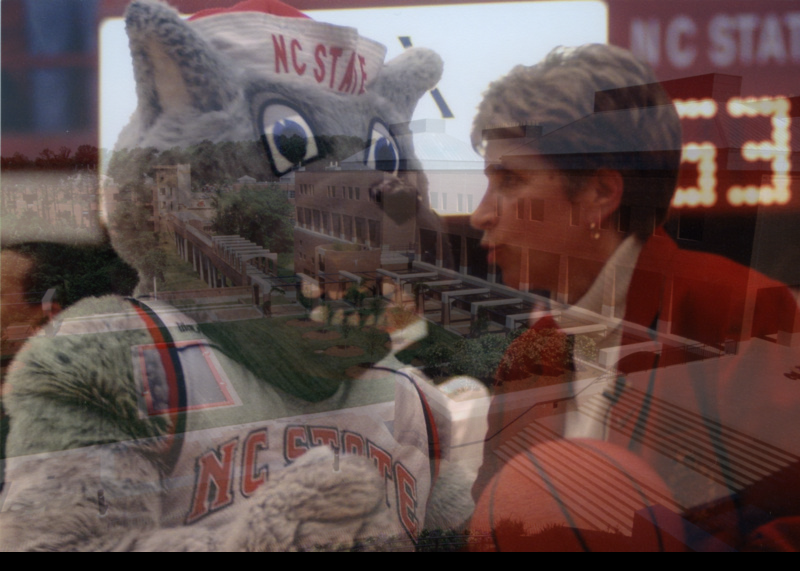

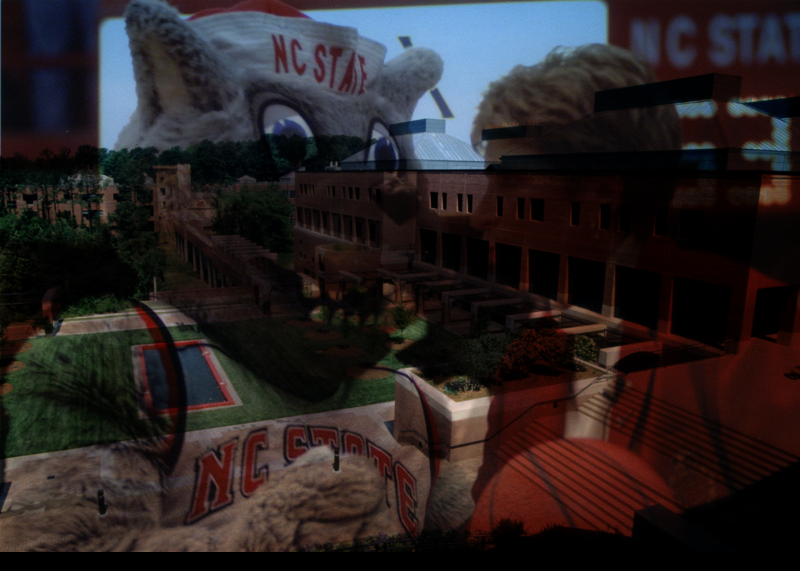

In [38]:
# Create a list to store the urls of the images
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
       "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
       "https://placekitten.com/800/571",
       "https://newspack-hipertextual.s3.eu-west-3.amazonaws.com/wp-content/uploads/2010/04/tux-vikingo.jpg",
       "https://superpet.pe/12997-cart_default/proplan-adulto-sensitive-razas-pequenas.jpg"]  
# Read and display the image
# loop over the image URLs, you could store several image urls in the list

'''
for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')
'''

a = 0.25
c = 255
image = io.imread(urls[0])
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image2 = io.imread(urls[1])
image2 = cv.cvtColor(image2, cv.COLOR_BGR2RGB)
image3 = np.zeros((571,800,3),np.uint8)
image4 = np.zeros((571,800,3),np.uint8)
image5 = np.zeros((571,800,3),np.uint8)
image6 = np.zeros((571,800,3),np.uint8)
image7 = np.zeros((571,800,3),np.uint8)
cv2_imshow(image)
print('\n')
i = 0
for x in image:
  #print(x)
  #print('\n')
  j = 0
  for y in x:
    #print(y)
    #y = y + 200
    #print(y)
    image3[i, j] = y + image2[i, j]
    image4[i, j] = y - image2[i, j]
    image5[i, j] = (y + image2[i, j])/2
    image6[i, j] = a*y + (1-a)*image2[i, j]
    image7[i, j] = y * (image2[i, j] / c)
    j += 1
    #break
  i += 1
  #break
cv2_imshow(image2)
print('\n')
cv2_imshow(image3)
print('\n')
cv2_imshow(image4)
print('\n')
cv2_imshow(image5)
print('\n')
cv2_imshow(image6)
print('\n')
cv2_imshow(image7)


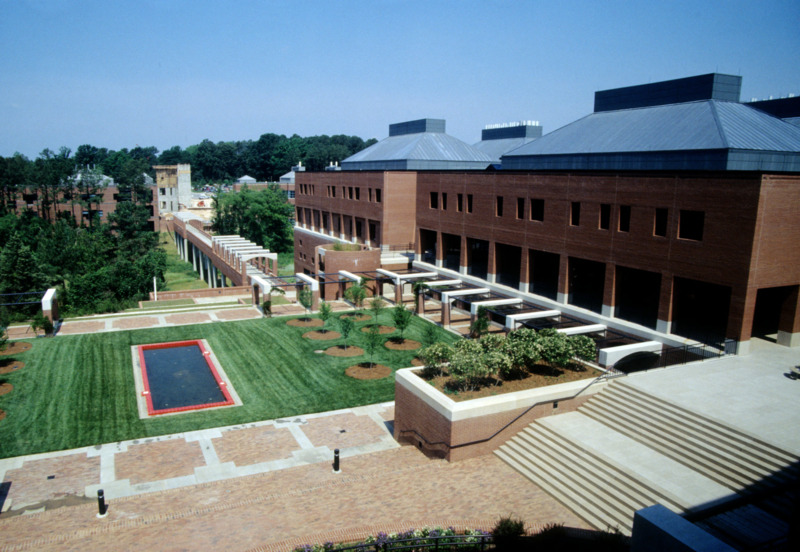

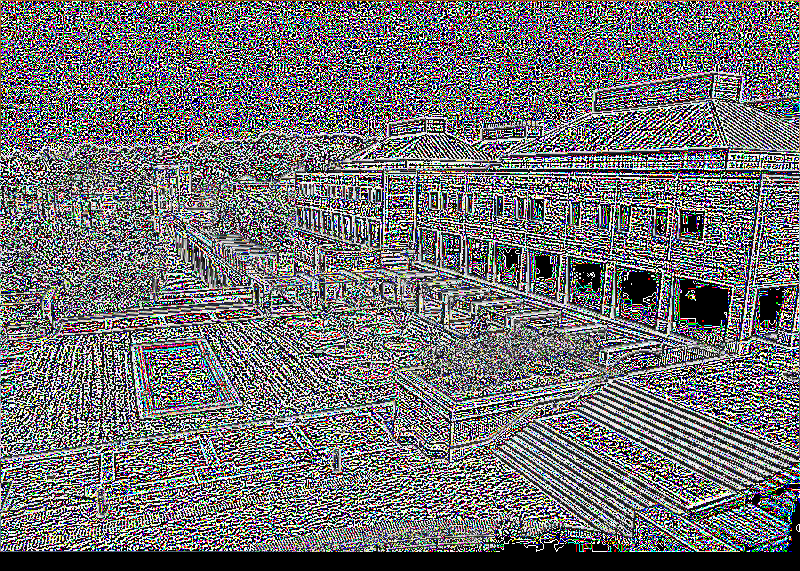

In [31]:
def convolucion(filter, a, b):
    xc = int(len(filter)/2)
    yc = int(len(filter[0])/2)
    #print('xc ', xc)
    #print('yc ', yc)
    pixel = 0
    i = 0
    for h in filter:
      j = 0
      for w in h:
        #print('a', i, ':', (a - (xc - i)))
        #print('b', j, ':', (b - (yc - j)))
        if (a - (xc - i)) < 0 or (b - (yc - j)) < 0:
           pixel += np.int16(0*w) # linea innecesaria para demostrar la estrategia tomada para los bordes
           #print('pixel', i, j, ':', 0*w)
        elif (a - (xc - i)) >= len(image) or (b - (yc - j)) >= len(image[0]):
           pixel += np.int16(0*w) # linea innecesaria para demostrar la estrategia tomada para los bordes
        else:
           #print('pixel1', i, j, ':', type(pixel))
           #print('image1', i, j, ':', type(image[a - (xc - i), b - (yc - j)]*w))
           #print('pixel1+image1', i, j, ':', ((pixel + image[a - (xc - i), b - (yc - j)]*w)).dtype)
           #print('dtype1', i, j, ':', (image[a - (xc - i), b - (yc - j)]*w).dtype)
           pixel += np.int16(image[a - (xc - i), b - (yc - j)]*w)
           #print('pixel', i, j, ':', image[a - (xc - i), b - (yc - j)]*w)
        j += 1
      i += 1
    return pixel



image = io.imread(urls[0])
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
image2 = np.zeros((571,800,3),np.uint8)
#fill = [[1,1,1],[1,-2,1],[-1,-1,-1]] # Filtro norte
#fill = [[-1,1,1],[-1,-2,1],[-1,1,1]] # Filtro este
#fill = [[1,1,1],[1,1,1],[1,1,1]] # desenfoque
fill = [[0,1,0],[1,-4,1],[0,1,0]] # deteccion de bordes
cv2_imshow(image)
print('\n')
i = 0
for x in image:
  j = 0
  for y in x:
    image2[i, j] = convolucion(fill, i, j)
    j += 1
    #break
  i += 1
  #break
    
cv2_imshow(image2)
#final_frame = cv.hconcat((image, image2))
#cv2_imshow(final_frame)
print('\n')

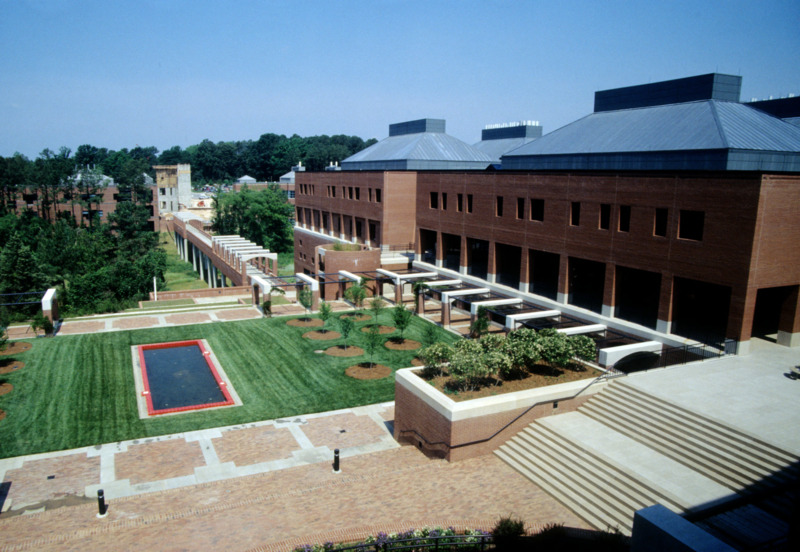

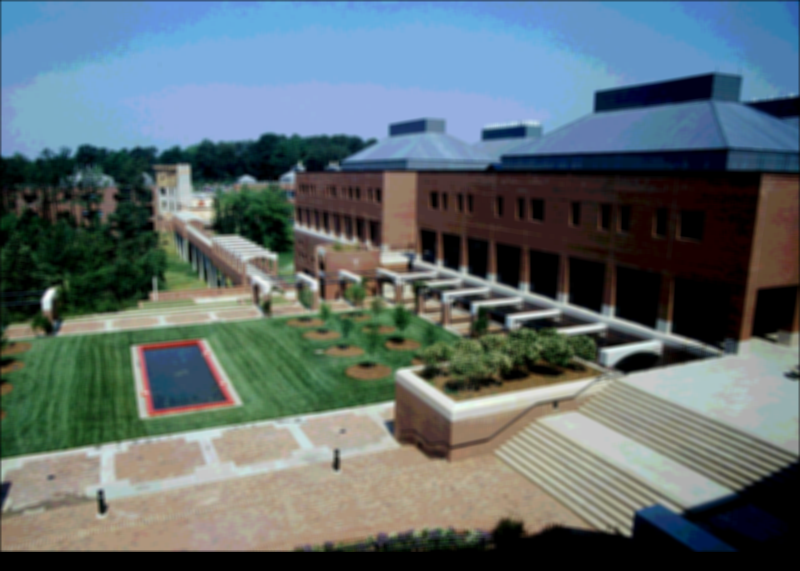

In [33]:
image3 = np.zeros((571,800,3),np.uint8)
#fill = [[1/9,1/9,1/9],[1/9,1/9,1/9],[1/9,1/9,1/9]] # mediana 3x3
fill = [[1/25,1/25,1/25,1/25,1/25],[1/25,1/25,1/25,1/25,1/25],[1/25,1/25,1/25,1/25,1/25],[1/25,1/25,1/25,1/25,1/25],[1/25,1/25,1/25,1/25,1/25]] # mediana 5x5
cv2_imshow(image)
print('\n')
i = 0
for x in image:
  j = 0
  for y in x:
    image3[i, j] = convolucion(fill, i, j)
    j += 1
  i += 1

cv2_imshow(image3)
print('\n')

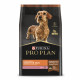

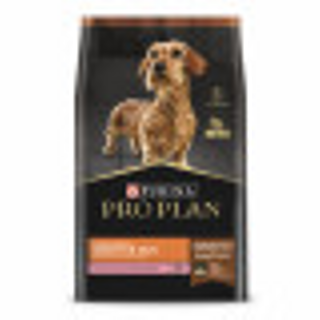

In [45]:
# Interpolation kernel
def u(s, a):
	if (abs(s) >= 0) & (abs(s) <= 1):
		return (a+2)*(abs(s)**3)-(a+3)*(abs(s)**2)+1
	elif (abs(s) > 1) & (abs(s) <= 2):
		return a*(abs(s)**3)-(5*a)*(abs(s)**2)+(8*a)*abs(s)-4*a
	return 0


# Padding
def padding(img, H, W, C):
	zimg = np.zeros((H+4, W+4, C))
	zimg[2:H+2, 2:W+2, :C] = img
	
	# Se rellena las 2 primeras celdas alrededor de la imagen inicial
	zimg[2:H+2, 0:2, :C] = img[:, 0:1, :C]
	zimg[H+2:H+4, 2:W+2, :] = img[H-1:H, :, :]
	zimg[2:H+2, W+2:W+4, :] = img[:, W-1:W, :]
	zimg[0:2, 2:W+2, :C] = img[0:1, :, :C]
	
	# Se rellenan las 4 esquinas faltantes (16 celdas)
	zimg[0:2, 0:2, :C] = img[0, 0, :C]
	zimg[H+2:H+4, 0:2, :C] = img[H-1, 0, :C]
	zimg[H+2:H+4, W+2:W+4, :C] = img[H-1, W-1, :C]
	zimg[0:2, W+2:W+4, :C] = img[0, W-1, :C]
	return zimg


# Bicubic operation
def bicubic(img, ratio, a):
	
	# Datos imagen (altura - H, ancho - W, canales/colores - C)
	H, W, C = img.shape
	
	img = padding(img, H, W, C)
	
	# Crear nueva imagen con dimensiones cambiadas a la escala enviada por parametro
	dH = math.floor(H*ratio)
	dW = math.floor(W*ratio)

	dst = np.zeros((dH, dW, C))

	h = 1/ratio

	inc = 0
	
	for c in range(C):
		for j in range(dH):
			for i in range(dW):
				
				# Getting the coordinates of the
				# nearby values
				x, y = i * h + 2, j * h + 2

				x1 = 1 + x - math.floor(x)
				x2 = x - math.floor(x)
				x3 = math.floor(x) + 1 - x
				x4 = math.floor(x) + 2 - x

				y1 = 1 + y - math.floor(y)
				y2 = y - math.floor(y)
				y3 = math.floor(y) + 1 - y
				y4 = math.floor(y) + 2 - y
				
				# Considering all nearby 16 values
				mat_l = np.matrix([[u(x1, a), u(x2, a), u(x3, a), u(x4, a)]])
				mat_m = np.matrix([[img[int(y-y1), int(x-x1), c],
									img[int(y-y2), int(x-x1), c],
									img[int(y+y3), int(x-x1), c],
									img[int(y+y4), int(x-x1), c]],
								[img[int(y-y1), int(x-x2), c],
									img[int(y-y2), int(x-x2), c],
									img[int(y+y3), int(x-x2), c],
									img[int(y+y4), int(x-x2), c]],
								[img[int(y-y1), int(x+x3), c],
									img[int(y-y2), int(x+x3), c],
									img[int(y+y3), int(x+x3), c],
									img[int(y+y4), int(x+x3), c]],
								[img[int(y-y1), int(x+x4), c],
									img[int(y-y2), int(x+x4), c],
									img[int(y+y3), int(x+x4), c],
									img[int(y+y4), int(x+x4), c]]])
				mat_r = np.matrix(
					[[u(y1, a)], [u(y2, a)], [u(y3, a)], [u(y4, a)]])
				
				# Here the dot function is used to get
				# the dot product of 2 matrices
				dst[j, i, c] = np.dot(np.dot(mat_l, mat_m), mat_r)

	# If there is an error message, it
	# directly goes to stderr
	# sys.stderr.write('\n')
	
	# Flushing the buffer
	# sys.stderr.flush()
	return dst


img = io.imread(urls[4])
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Escala zoom
ratio = 4
# Coefficient
a = -1/2

dst = bicubic(img, ratio, a)

cv2_imshow(img)
print('\n')
cv2_imshow(dst)
print('\n')


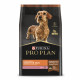

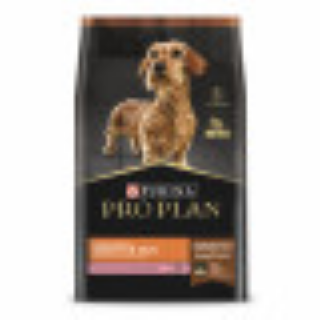

In [46]:
def bl_resize(original_img, new_h, new_w):
	#get dimensions of original image
	old_h, old_w, c = original_img.shape
	#create an array of the desired shape. 
	#We will fill-in the values later.
	resized = np.zeros((new_h, new_w, c))
	#Calculate horizontal and vertical scaling factor
	w_scale_factor = (old_w ) / (new_w ) if new_h != 0 else 0
	h_scale_factor = (old_h ) / (new_h ) if new_w != 0 else 0
	for i in range(new_h):
		for j in range(new_w):
			#map the coordinates back to the original image
			x = i * h_scale_factor
			y = j * w_scale_factor
			#calculate the coordinate values for 4 surrounding pixels.
			x_floor = math.floor(x)
			x_ceil = min( old_h - 1, math.ceil(x))
			y_floor = math.floor(y)
			y_ceil = min(old_w - 1, math.ceil(y))

			if (x_ceil == x_floor) and (y_ceil == y_floor):
				q = original_img[int(x), int(y), :]
			elif (x_ceil == x_floor):
				q1 = original_img[int(x), int(y_floor), :]
				q2 = original_img[int(x), int(y_ceil), :]
				q = q1 * (y_ceil - y) + q2 * (y - y_floor)
			elif (y_ceil == y_floor):
				q1 = original_img[int(x_floor), int(y), :]
				q2 = original_img[int(x_ceil), int(y), :]
				q = (q1 * (x_ceil - x)) + (q2	 * (x - x_floor))
			else:
				v1 = original_img[x_floor, y_floor, :]
				v2 = original_img[x_ceil, y_floor, :]
				v3 = original_img[x_floor, y_ceil, :]
				v4 = original_img[x_ceil, y_ceil, :]

				q1 = v1 * (x_ceil - x) + v2 * (x - x_floor)
				q2 = v3 * (x_ceil - x) + v4 * (x - x_floor)
				q = q1 * (y_ceil - y) + q2 * (y - y_floor)

			resized[i,j,:] = q
	return resized.astype(np.uint8)

img = io.imread(urls[4])
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

H, W, C = img.shape

# Passing the input image in the
# bicubic function
dst = bl_resize(img, H*4, W*4)

cv2_imshow(img)
print('\n')
cv2_imshow(dst)
print('\n')

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(image.dtype)
print(image_2.dtype)
# Check the height of image 
print(image.shape[0])
# Check the width of image 
print(image.shape[1])
# Check the number of channels of the image
print(image.shape[2])

uint8
uint8
571
800
3


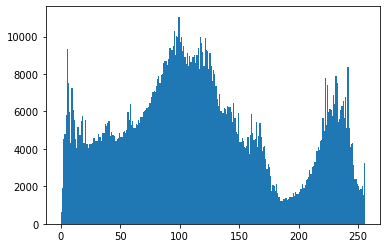

In [ ]:
plt.hist(image.ravel(),bins = 256, range = [0,256]) 
plt.show()

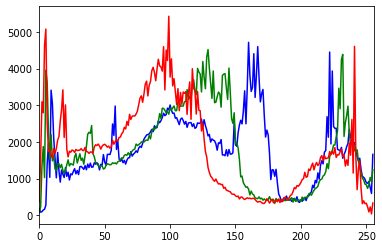

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

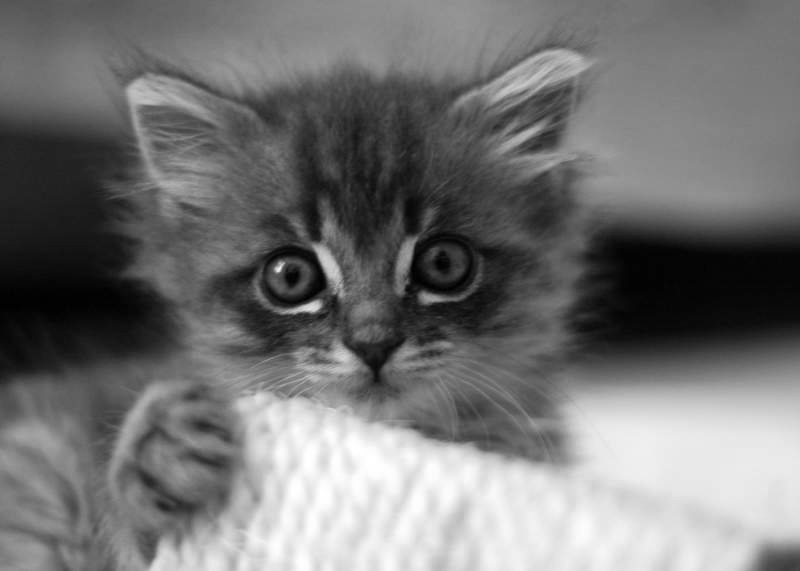

In [ ]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

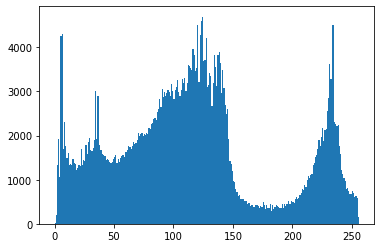

In [ ]:
# Plot the histogram of the gray image. We could observe that the frequency of
# the image hist has decreased ~ 1/3 of the histogram of color image
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

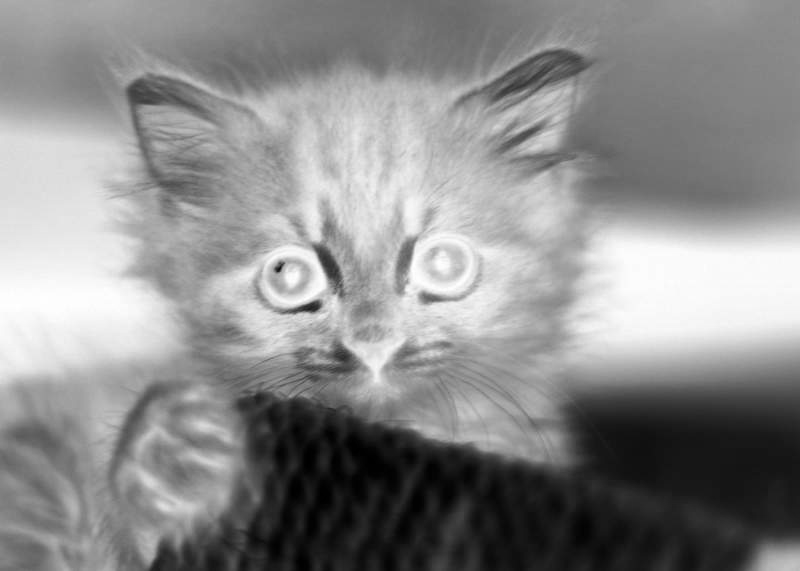

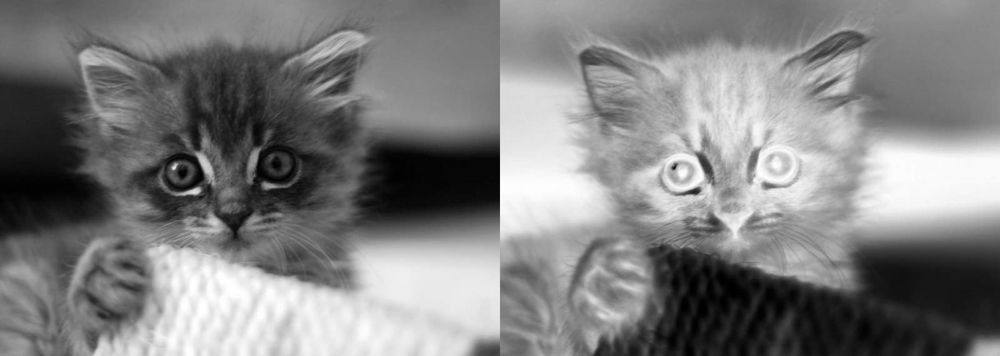

In [ ]:
# The lightness level of the gray_image decreases after this step
#im4 = 255.0*(gray_image/255.0)**2
im4 = 255.0 - gray_image
cv2_imshow(im4)
#print(gray_image.dtype)
im4 = im4.round().astype(np.uint8)
#print(im4.dtype)
final_frame = cv.hconcat((gray_image, im4))
cv2_imshow(final_frame)

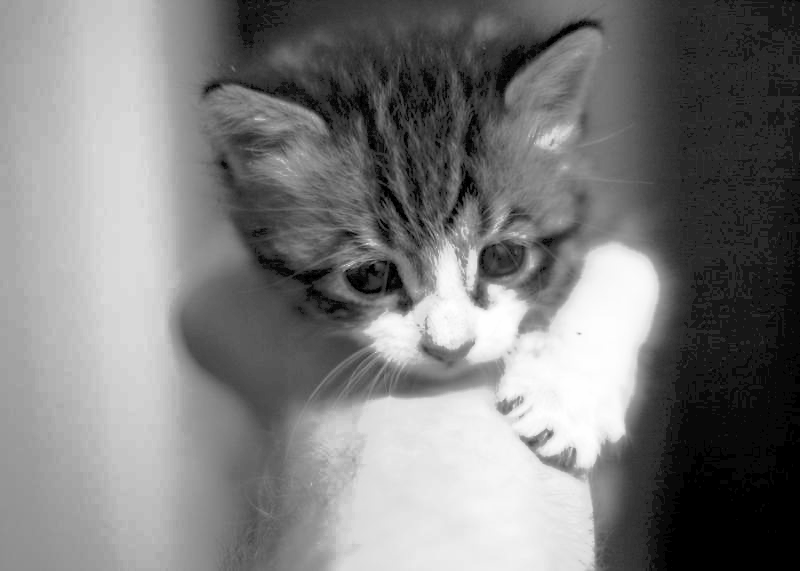

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
im5 = histeq(im4)
cv2_imshow(im5)